In [1]:
# =============================================================================
# ANN WIND SPEED FORECASTING — LAG LENGTH OPTIMISATION (1 to 14)
# =============================================================================
# This script trains an ANN (MLP) for univariate wind speed forecasting
# (WS10M). The optimal autoregressive lag length (1–14) is identified
# jointly with the model hyperparameters under four strategies:
#
#   1. Original Model  (manual hyperparameters — tested across all lags)
#   2. Grid Search     (grid over hyperparams × lags 1–14)
#   3. Randomized Search (random sampling over hyperparams × lags 1–14)
#   4. Optuna          (Bayesian optimisation over hyperparams + lag)
#
# Data split: 80 % train | 20 % test (chronological, no shuffling).
# All hyperparameter tuning is performed exclusively on training data
# using TimeSeriesSplit cross-validation to prevent data leakage.
# The test set is used ONLY for final evaluation.
# =============================================================================

# ─────────────────────────────────────────────────────────────────────────────
# SECTION 1: PACKAGE INSTALLATION
# ─────────────────────────────────────────────────────────────────────────────

! pip install optuna
# pip install tensorflow
# pip install scikit-learn

# ─────────────────────────────────────────────────────────────────────────────
# SECTION 2: IMPORT LIBRARIES
# ─────────────────────────────────────────────────────────────────────────────

# Standard libraries
import random
import warnings
from itertools import product
warnings.filterwarnings("ignore")

# Data manipulation
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter

# TensorFlow / Keras
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam, SGD, RMSprop

# Scikit-learn
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Optuna for Bayesian optimisation
import optuna
from optuna.samplers import TPESampler
optuna.logging.set_verbosity(optuna.logging.WARNING)   # Suppress verbose output


In [2]:
# ─────────────────────────────────────────────────────────────────────────────
# SECTION 3: REPRODUCIBILITY SEEDS
# ─────────────────────────────────────────────────────────────────────────────

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ─────────────────────────────────────────────────────────────────────────────
# SECTION 4: LOAD DATASET
# ─────────────────────────────────────────────────────────────────────────────

# Dataset source (Google Sheets exported as CSV):
# https://docs.google.com/spreadsheets/d/1j_Euo80PrGckVDVr2hTG9zZebxJD0TSC

sheet_id   = "1j_Euo80PrGckVDVr2hTG9zZebxJD0TSC"
sheet_name = "Sheet1"
csv_url    = (
    f"https://docs.google.com/spreadsheets/d/{sheet_id}"
    f"/gviz/tq?tqx=out:csv&sheet={sheet_name}"
)

# Read the Google Sheet as CSV
df = pd.read_csv(csv_url)

# Backup original DataFrame before any modifications
df_backup = df.copy()

# Set Date as the index and convert to datetime for proper date-axis plotting
df = df.set_index('Date')
df.index = pd.to_datetime(df.index)

# Drop calendar columns (YEAR, MO, DY) — not needed as model features
df = df.drop(columns=["YEAR", "MO", "DY"])

# Keep only the target variable: Wind Speed at 10 metres (WS10M)
df = df[["WS10M"]].astype(float)

print("Dataset loaded. Shape:", df.shape)
print(df.head())

Dataset loaded. Shape: (4017, 1)
            WS10M
Date             
2013-01-01   3.99
2013-01-02   4.25
2013-01-03   4.75
2013-01-04   5.74
2013-01-05   5.79


In [3]:



# ─────────────────────────────────────────────────────────────────────────────
# SECTION 5: HELPER FUNCTIONS
# ─────────────────────────────────────────────────────────────────────────────

def create_lagged_features(data, lags):
    """
    Create autoregressive lag features for the time series.

    Parameters:
        data : DataFrame containing the WS10M column
        lags : int, number of lag periods to create

    Returns:
        lagged_df : DataFrame with original column plus lag columns,
                    NaN rows dropped
    """
    lagged_df = data.copy()
    for col in data.columns:
        for lag in range(1, lags + 1):
            lagged_df[f"{col}_lag_{lag}"] = data[col].shift(lag)
    return lagged_df.dropna()


def build_ann(params, n_features):
    """
    Build and compile a fully-connected ANN for regression.

    Parameters:
        params     : dict of hyperparameters (input_units, activation,
                     num_layers, n_units_i, dropout_rate_i, optimizer)
        n_features : int, number of input features

    Returns:
        compiled Keras Sequential model
    """
    model = Sequential()

    # Input layer
    model.add(Dense(params['input_units'],
                    input_dim=n_features,
                    activation=params['activation']))

    # Hidden layers
    for i in range(params['num_layers']):
        model.add(Dense(params[f'n_units_{i}'],
                        activation=params['activation']))
        model.add(Dropout(params.get(f'dropout_rate_{i}', 0.0)))

    # Output layer (single regression target)
    model.add(Dense(1))

    # Select optimizer
    opt_map = {"Adam": Adam(), "RMSprop": RMSprop(), "SGD": SGD()}
    optimizer = opt_map.get(params['optimizer'], Adam())

    model.compile(optimizer=optimizer, loss='mean_squared_error')
    return model


def prepare_lag_data(lag):
    """
    Create lag features, split chronologically 80/20, and apply MinMaxScaling.
    NOTE: Both scalers are fit ONLY on the training portion to prevent
    data leakage from the test set into the training transform.

    Parameters:
        lag : int, number of autoregressive lag terms

    Returns:
        X_train_scaled, X_test_scaled : numpy arrays (scaled)
        y_train_scaled, y_test_scaled : numpy arrays (scaled, flat)
        y_test_inv                    : numpy array, test target in original scale
        test_dates                    : DatetimeIndex, dates of test observations
        scaler_y                      : fitted MinMaxScaler for inverse transform
        X_train_cols                  : list of feature column names
    """
    df_lagged  = create_lagged_features(df, lag)

    train_size = int(len(df_lagged) * 0.8)   # 80% training
    train      = df_lagged.iloc[:train_size]
    test       = df_lagged.iloc[train_size:]
    test_dates = test.index                   # Preserve dates for plotting

    X_train = train.drop(columns=["WS10M"])
    y_train = train["WS10M"]
    X_test  = test.drop(columns=["WS10M"])
    y_test  = test["WS10M"]

    # Fit scalers on training data only — transform test data with same scaler
    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    X_test_scaled  = scaler_X.transform(X_test)

    y_train_scaled = scaler_y.fit_transform(
        y_train.values.reshape(-1, 1)
    ).ravel()
    y_test_scaled  = scaler_y.transform(
        y_test.values.reshape(-1, 1)
    ).ravel()

    # Inverse-scale the test target for metric computation
    y_test_inv = scaler_y.inverse_transform(
        y_test_scaled.reshape(-1, 1)
    ).flatten()

    return (X_train_scaled, X_test_scaled,
            y_train_scaled, y_test_scaled,
            y_test_inv, test_dates, scaler_y,
            X_train.columns.tolist())


def compute_metrics(y_true, y_pred):
    """
    Compute MSE, RMSE, MAE, MAPE, and R² for a set of predictions.

    Parameters:
        y_true : array-like, actual values
        y_pred : array-like, predicted values

    Returns:
        dict with keys: mse, rmse, mae, mape, r2
    """
    y_true = np.array(y_true).flatten()
    y_pred = np.array(y_pred).flatten()

    mse  = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae  = mean_absolute_error(y_true, y_pred)
    # Small epsilon in denominator prevents division by zero
    mape = np.mean(np.abs((y_true - y_pred) / (y_true + 1e-10))) * 100
    r2   = r2_score(y_true, y_pred)

    return dict(mse=mse, rmse=rmse, mae=mae, mape=mape, r2=r2)


def print_metrics(metrics, label):
    """Print a formatted metrics report."""
    print(f"\n{'*' * 55}")
    print(f"  {label}")
    print(f"{'*' * 55}")
    print(f"  MSE       : {metrics['mse']:.6f}")
    print(f"  RMSE      : {metrics['rmse']:.6f}")
    print(f"  MAE       : {metrics['mae']:.6f}")
    print(f"  MAPE      : {metrics['mape']:.6f} %")
    print(f"  R-squared : {metrics['r2']:.6f}")
    print(f"{'*' * 55}")

def print_optimal_model_box(method_name, optimal_lag, best_params, metrics):
    """
    Print a clearly formatted box summarising the optimal model found
    by a given hyperparameter tuning method.

    Parameters:
        method_name : str,  e.g. 'Original Model', 'Grid Search'
        optimal_lag : int,  best lag length identified
        best_params : dict, hyperparameters of the optimal model
        metrics     : dict, keys mse / rmse / mae / mape / r2
    """
    border = "█" * 65
    print(f"\n{border}")
    print(f"  ✦  OPTIMAL MODEL SUMMARY — {method_name.upper()}")
    print(border)
    print(f"  Optimal Lag Length : {optimal_lag}")
    print(f"  {'─' * 61}")
    print(f"  Hyperparameters:")
    for k, v in best_params.items():
        print(f"    {k:<22} : {v}")
    print(f"  {'─' * 61}")
    print(f"  Test Set Performance:")
    print(f"    {'MSE':<22} : {metrics['mse']:.6f}")
    print(f"    {'RMSE':<22} : {metrics['rmse']:.6f}")
    print(f"    {'MAE':<22} : {metrics['mae']:.6f}")
    print(f"    {'MAPE':<22} : {metrics['mape']:.6f} %")
    print(f"    {'R-squared':<22} : {metrics['r2']:.6f}")
    print(f"{border}\n")

def plot_predictions(test_dates, y_true, y_pred, title):
    """
    Plot actual vs predicted wind speed values against date.

    Parameters:
        test_dates : DatetimeIndex
        y_true     : array-like, actual values
        y_pred     : array-like, predicted values
        title      : str, plot title
    """
    plt.figure(figsize=(14, 6))
    plt.plot(test_dates, y_true, label="Actual",    linewidth=2,   linestyle="-")
    plt.plot(test_dates, y_pred, label="Predicted", linewidth=1.5, linestyle="--")
    plt.title(title, fontsize=14)
    plt.xlabel("Date", fontsize=12)
    plt.ylabel("Wind Speed (WS10M)", fontsize=12)
    plt.gca().xaxis.set_major_formatter(DateFormatter("%Y-%m"))
    plt.gcf().autofmt_xdate()
    plt.legend(fontsize=12)
    plt.grid(linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


def cross_validate_model(params, X_train_scaled, y_train_scaled, n_splits=3):
    """
    Evaluate a set of hyperparameters using TimeSeriesSplit CV.
    Returns the mean validation MSE across folds, or infinity on error.

    Parameters:
        params          : dict, model hyperparameters
        X_train_scaled  : numpy array, scaled training features
        y_train_scaled  : numpy array, scaled training target
        n_splits        : int, number of TimeSeriesSplit folds

    Returns:
        float, mean validation MSE (lower is better)
    """
    tscv       = TimeSeriesSplit(n_splits=n_splits)
    val_losses = []

    try:
        for train_idx, val_idx in tscv.split(X_train_scaled):
            X_t, X_v = X_train_scaled[train_idx], X_train_scaled[val_idx]
            y_t, y_v = y_train_scaled[train_idx], y_train_scaled[val_idx]

            model = build_ann(params, n_features=X_t.shape[1])
            history = model.fit(
                X_t, y_t,
                epochs          = params['epochs'],
                batch_size      = params['batch_size'],
                validation_data = (X_v, y_v),
                verbose         = 0
            )
            val_losses.append(history.history['val_loss'][-1])

    except Exception as e:
        print(f"    Skipping combination due to error: {e}")
        return float('inf')

    return np.mean(val_losses)


SECTION 6: ORIGINAL MODEL (No Hyperparameter Tuning)

  Original Model — Lag 1
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step

*******************************************************
  Original Model — Lag 1
*******************************************************
  MSE       : 0.773680
  RMSE      : 0.879591
  MAE       : 0.679396
  MAPE      : 19.114112 %
  R-squared : 0.678791
*******************************************************


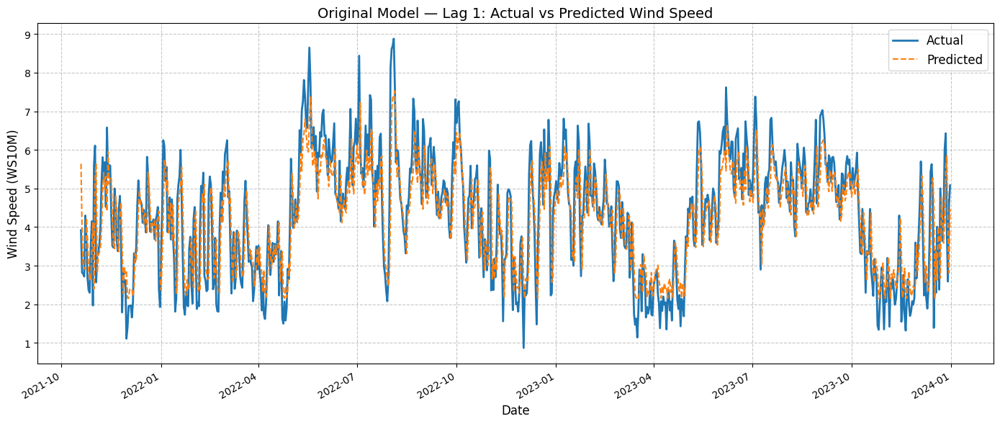


  Original Model — Lag 2
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

*******************************************************
  Original Model — Lag 2
*******************************************************
  MSE       : 0.789409
  RMSE      : 0.888487
  MAE       : 0.688514
  MAPE      : 19.116505 %
  R-squared : 0.672640
*******************************************************


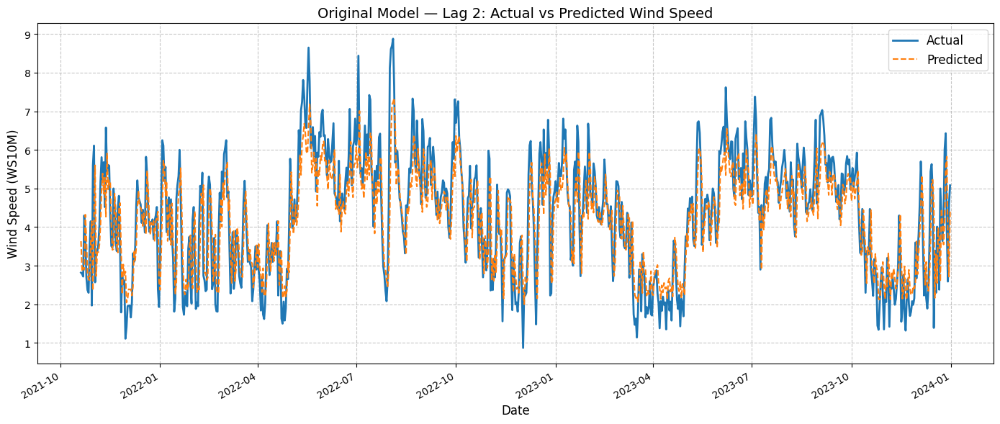


  Original Model — Lag 3
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

*******************************************************
  Original Model — Lag 3
*******************************************************
  MSE       : 0.754641
  RMSE      : 0.868701
  MAE       : 0.670125
  MAPE      : 19.084709 %
  R-squared : 0.687058
*******************************************************


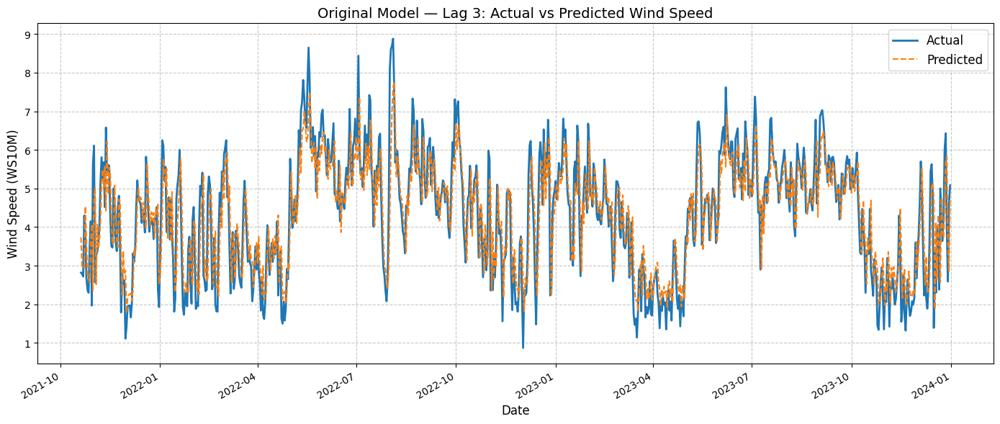


  Original Model — Lag 4
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

*******************************************************
  Original Model — Lag 4
*******************************************************
  MSE       : 0.762660
  RMSE      : 0.873304
  MAE       : 0.677778
  MAPE      : 19.250715 %
  R-squared : 0.683733
*******************************************************


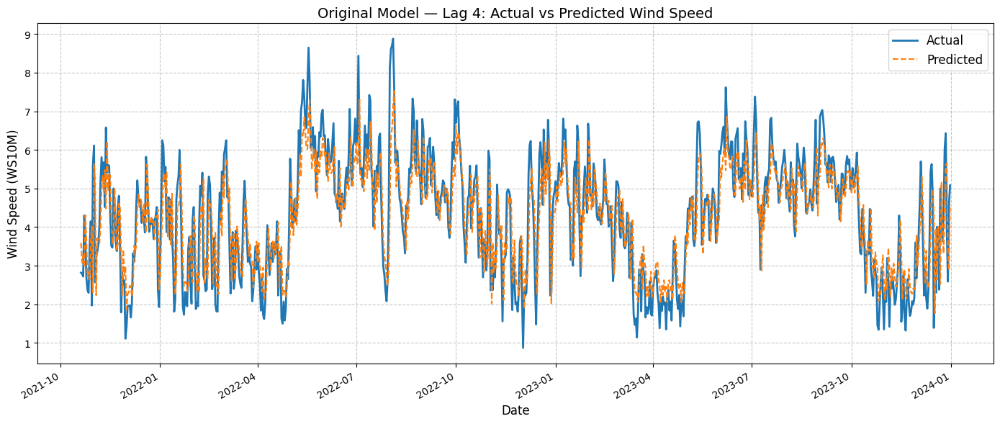


  Original Model — Lag 5
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

*******************************************************
  Original Model — Lag 5
*******************************************************
  MSE       : 0.757715
  RMSE      : 0.870468
  MAE       : 0.672963
  MAPE      : 19.010887 %
  R-squared : 0.685784
*******************************************************


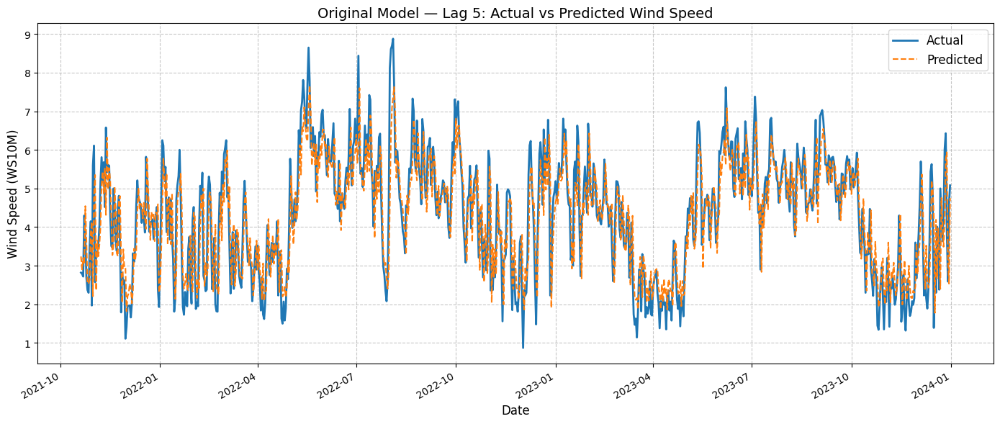


  Original Model — Lag 6
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

*******************************************************
  Original Model — Lag 6
*******************************************************
  MSE       : 0.760027
  RMSE      : 0.871795
  MAE       : 0.673840
  MAPE      : 19.471425 %
  R-squared : 0.684825
*******************************************************


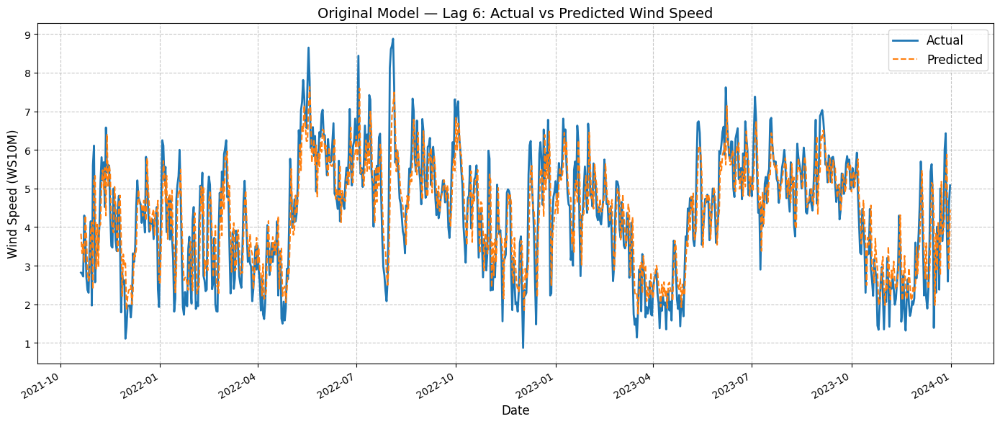


  Original Model — Lag 7
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

*******************************************************
  Original Model — Lag 7
*******************************************************
  MSE       : 0.743009
  RMSE      : 0.861980
  MAE       : 0.669229
  MAPE      : 19.266898 %
  R-squared : 0.691905
*******************************************************


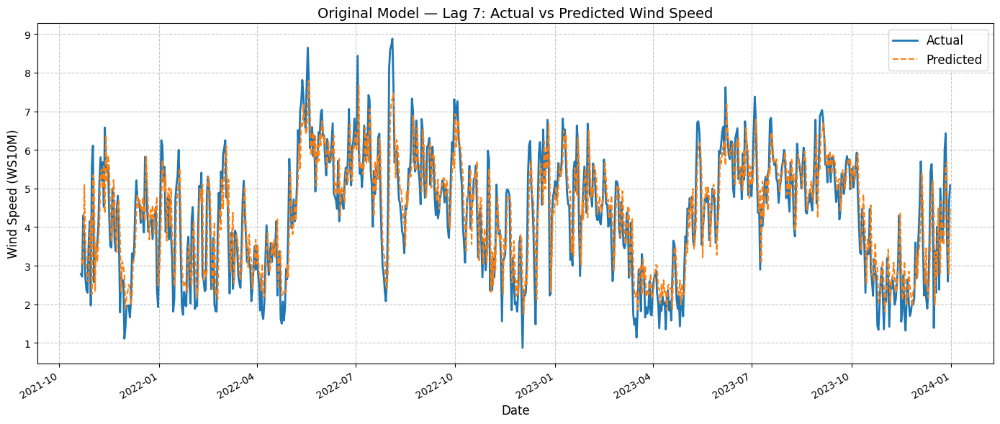


  Original Model — Lag 8
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

*******************************************************
  Original Model — Lag 8
*******************************************************
  MSE       : 0.734317
  RMSE      : 0.856923
  MAE       : 0.661926
  MAPE      : 18.692035 %
  R-squared : 0.695509
*******************************************************


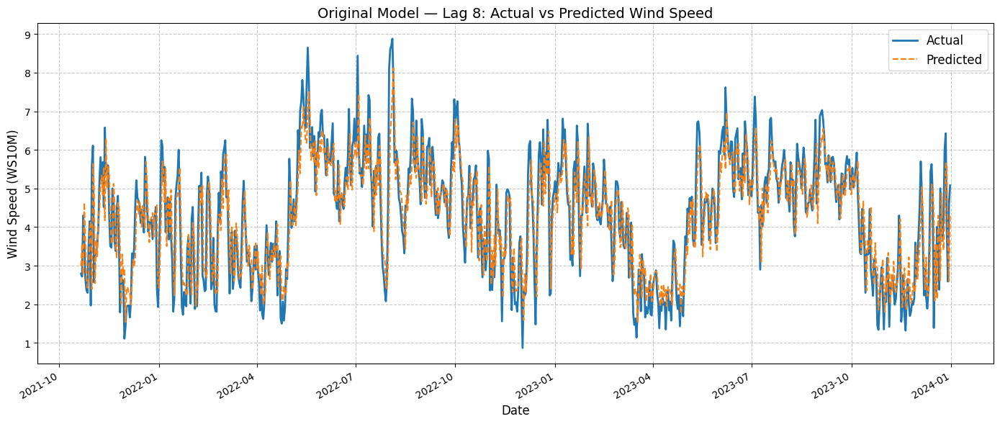


  Original Model — Lag 9
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

*******************************************************
  Original Model — Lag 9
*******************************************************
  MSE       : 0.735974
  RMSE      : 0.857889
  MAE       : 0.658590
  MAPE      : 18.495861 %
  R-squared : 0.694822
*******************************************************


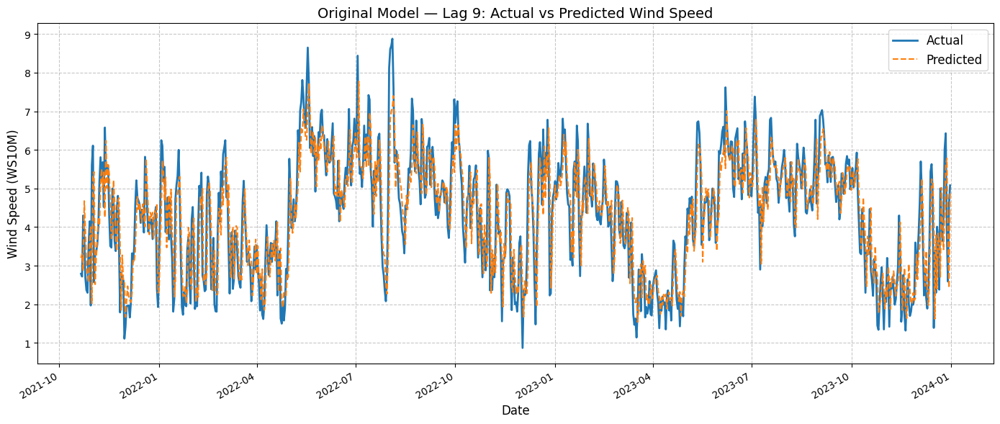


  Original Model — Lag 10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

*******************************************************
  Original Model — Lag 10
*******************************************************
  MSE       : 0.745972
  RMSE      : 0.863697
  MAE       : 0.665249
  MAPE      : 18.950344 %
  R-squared : 0.690676
*******************************************************


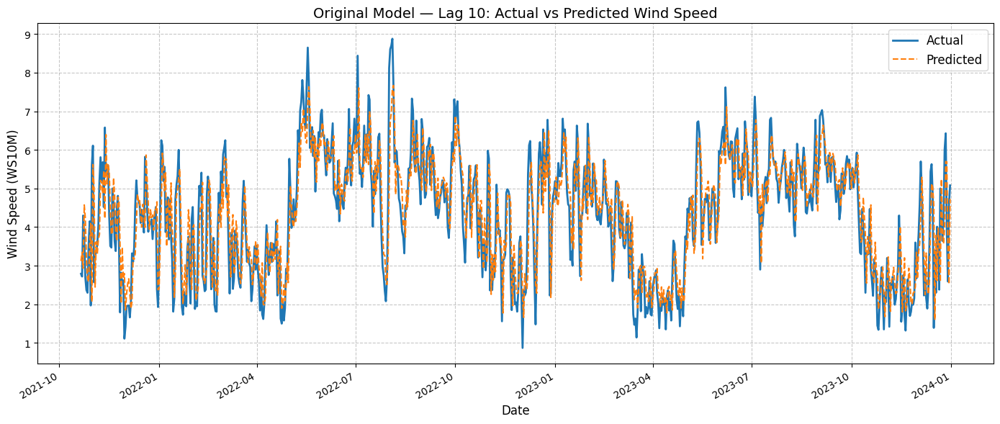


  Original Model — Lag 11
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

*******************************************************
  Original Model — Lag 11
*******************************************************
  MSE       : 0.779077
  RMSE      : 0.882653
  MAE       : 0.677631
  MAPE      : 18.705729 %
  R-squared : 0.676949
*******************************************************


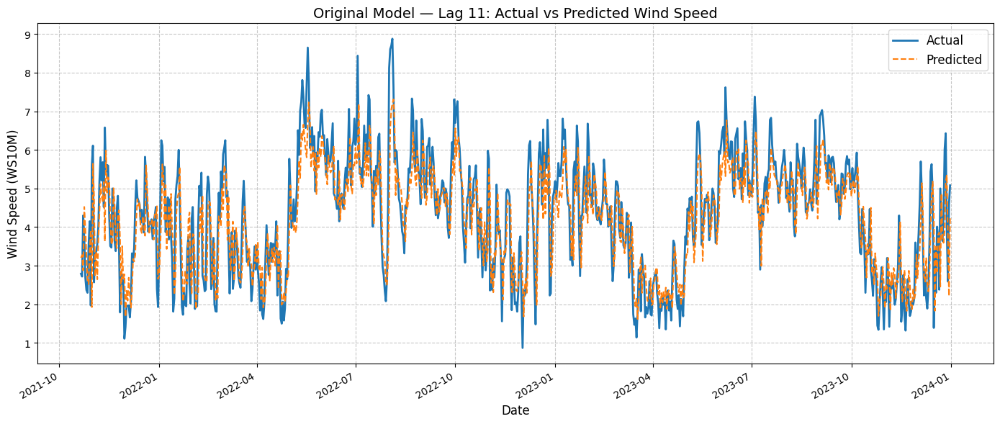


  Original Model — Lag 12
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

*******************************************************
  Original Model — Lag 12
*******************************************************
  MSE       : 0.753490
  RMSE      : 0.868038
  MAE       : 0.673829
  MAPE      : 19.611435 %
  R-squared : 0.687567
*******************************************************


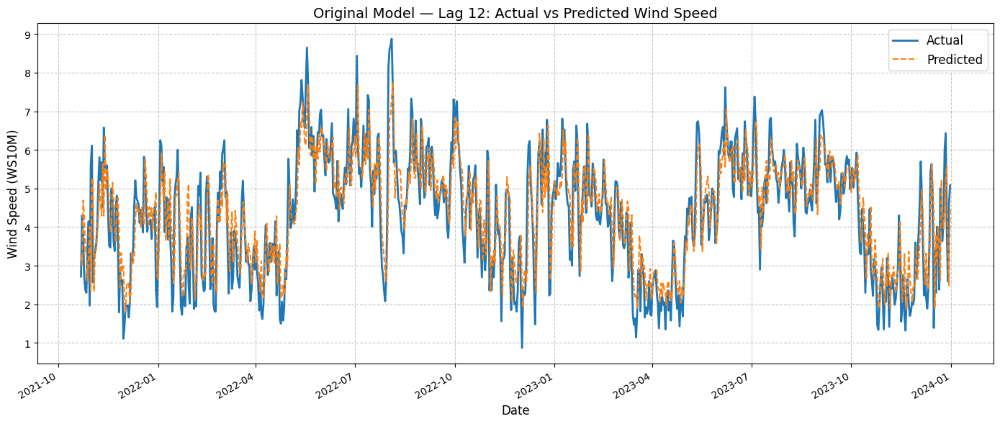


  Original Model — Lag 13
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

*******************************************************
  Original Model — Lag 13
*******************************************************
  MSE       : 0.791680
  RMSE      : 0.889764
  MAE       : 0.691130
  MAPE      : 20.276400 %
  R-squared : 0.671731
*******************************************************


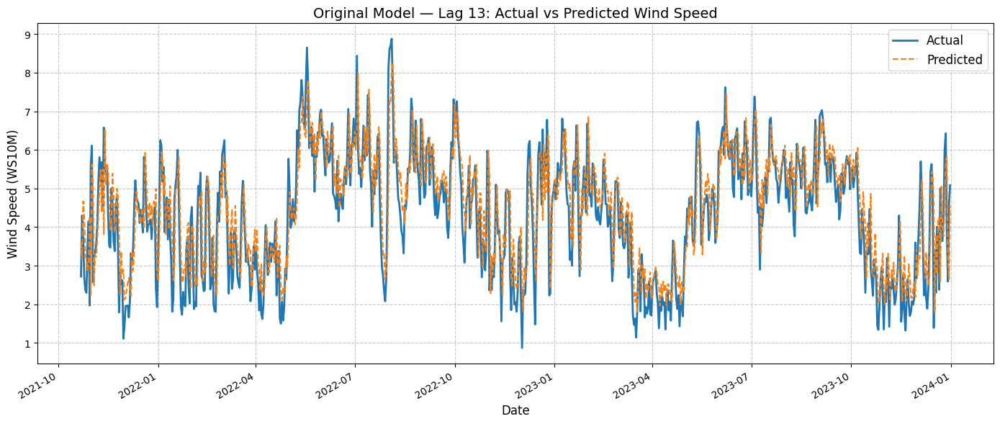


  Original Model — Lag 14
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

*******************************************************
  Original Model — Lag 14
*******************************************************
  MSE       : 0.755103
  RMSE      : 0.868967
  MAE       : 0.674665
  MAPE      : 19.777664 %
  R-squared : 0.686898
*******************************************************


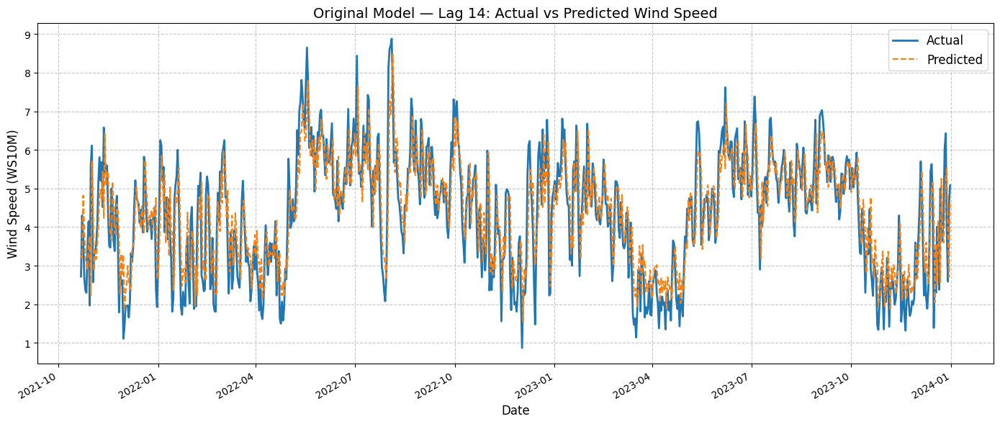


ORIGINAL MODEL — SUMMARY ACROSS ALL LAGS
          mse      rmse       mae       mape        r2
lag                                                   
1    0.773680  0.879591  0.679396  19.114112  0.678791
2    0.789409  0.888487  0.688514  19.116505  0.672640
3    0.754641  0.868701  0.670125  19.084709  0.687058
4    0.762660  0.873304  0.677778  19.250715  0.683733
5    0.757715  0.870468  0.672963  19.010887  0.685784
6    0.760027  0.871795  0.673840  19.471425  0.684825
7    0.743009  0.861980  0.669229  19.266898  0.691905
8    0.734317  0.856923  0.661926  18.692035  0.695509
9    0.735974  0.857889  0.658590  18.495861  0.694822
10   0.745972  0.863697  0.665249  18.950344  0.690676
11   0.779077  0.882653  0.677631  18.705729  0.676949
12   0.753490  0.868038  0.673829  19.611435  0.687567
13   0.791680  0.889764  0.691130  20.276400  0.671731
14   0.755103  0.868967  0.674665  19.777664  0.686898

→ Optimal Lag (Original Model): 8

******************************************

In [ ]:


# ─────────────────────────────────────────────────────────────────────────────
# SECTION 6: ORIGINAL MODEL — MANUAL HYPERPARAMETERS, LAGS 1–14
# ─────────────────────────────────────────────────────────────────────────────
# Fixed hyperparameters are used across all lag lengths. The lag that produces
# the lowest test RMSE is selected as the optimal window size.

print("\n" + "=" * 70)
print("SECTION 6: ORIGINAL MODEL (No Hyperparameter Tuning)")
print("=" * 70)

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Fixed hyperparameters for the baseline model
ORIG_PARAMS = {
    'input_units':   64,
    'activation':    'relu',
    'num_layers':    1,
    'n_units_0':     32,
    'dropout_rate_0': 0.2,
    'optimizer':     'Adam',
    'batch_size':    32,
    'epochs':        50,
}

orig_results = []

for lag in range(1, 15):
    print(f"\n{'=' * 50}")
    print(f"  Original Model — Lag {lag}")
    print(f"{'=' * 50}")

    (X_train_s, X_test_s,
     y_train_s, y_test_s,
     y_test_inv, test_dates,
     scaler_y, _) = prepare_lag_data(lag)

    # Train on full training set with fixed parameters
    model_orig = build_ann(ORIG_PARAMS, n_features=X_train_s.shape[1])
    model_orig.fit(
        X_train_s, y_train_s,
        epochs     = ORIG_PARAMS['epochs'],
        batch_size = ORIG_PARAMS['batch_size'],
        verbose    = 0
    )

    # Predict and inverse scale
    y_pred_scaled = model_orig.predict(X_test_s).flatten()
    y_pred_inv    = scaler_y.inverse_transform(
        y_pred_scaled.reshape(-1, 1)
    ).flatten()

    # Compute and print metrics
    m = compute_metrics(y_test_inv, y_pred_inv)
    print_metrics(m, f"Original Model — Lag {lag}")

    # Plot actual vs predicted
    plot_predictions(
        test_dates, y_test_inv, y_pred_inv,
        title=f"Original Model — Lag {lag}: Actual vs Predicted Wind Speed"
    )

    orig_results.append({'lag': lag, **m})

# Identify optimal lag for the original model
orig_summary = pd.DataFrame(orig_results).set_index('lag')
best_orig_lag = orig_summary['rmse'].idxmin()
best_orig_row = orig_summary.loc[best_orig_lag]

print("\n" + "=" * 70)
print("ORIGINAL MODEL — SUMMARY ACROSS ALL LAGS")
print("=" * 70)
print(orig_summary.round(6))
print(f"\n→ Optimal Lag (Original Model): {best_orig_lag}")
print_metrics(best_orig_row.to_dict(), f"Original Model — Best Lag {best_orig_lag}")


# ── Optimal model box for Original Model ────────────────────────────────────
print_optimal_model_box(
    method_name = "Original Model",
    optimal_lag = best_orig_lag,
    best_params = ORIG_PARAMS,
    metrics     = best_orig_row.to_dict()
)

In [4]:


# ─────────────────────────────────────────────────────────────────────────────
# SECTION 7: GRID SEARCH — HYPERPARAMETERS × LAGS 1–14
# ─────────────────────────────────────────────────────────────────────────────
# For each lag length (1–14), a full grid search is conducted over the
# hyperparameter space using TimeSeriesSplit cross-validation on the training
# set. The combination of lag + hyperparameters that yields the lowest
# mean validation MSE is selected as the overall best configuration.

print("\n" + "=" * 70)
print("SECTION 7: GRID SEARCH HYPERPARAMETER TUNING")
print("=" * 70)

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Hyperparameter search grid
PARAM_GRID = {
    'input_units':    [32, 64],
    'activation':     ['relu'],
    'num_layers':     [1, 2],
    'n_units_0':      [64, 128],
    'n_units_1':      [64],
    'dropout_rate_0': [0.0, 0.2],
    'dropout_rate_1': [0.0],
    'optimizer':      ['Adam'],
    'batch_size':     [32],
    'epochs':         [20, 30]
}


def generate_grid_params(param_grid):
    """
    Generator that yields all valid hyperparameter combinations.
    Parameters irrelevant for num_layers == 1 are automatically removed.
    """
    keys   = list(param_grid.keys())
    values = list(param_grid.values())
    for combination in product(*values):
        params = dict(zip(keys, combination))
        # Remove layer-2 parameters when num_layers == 1
        if params['num_layers'] == 1:
            params.pop('n_units_1',      None)
            params.pop('dropout_rate_1', None)
        yield params


grid_results = []

for lag in range(1, 15):
    print(f"\n{'=' * 50}")
    print(f"  Grid Search — Lag {lag}")
    print(f"{'=' * 50}")

    (X_train_s, X_test_s,
     y_train_s, y_test_s,
     y_test_inv, test_dates,
     scaler_y, _) = prepare_lag_data(lag)

    total_combinations  = sum(1 for _ in generate_grid_params(PARAM_GRID))
    current_combination = 0
    best_val_loss_grid  = float('inf')
    best_params_grid    = None

    # Exhaustive grid search using TimeSeriesSplit CV on training data
    for params in generate_grid_params(PARAM_GRID):
        current_combination += 1
        print(f"  Combination {current_combination}/{total_combinations}", end="\r")

        mean_val = cross_validate_model(params, X_train_s, y_train_s, n_splits=3)

        if mean_val < best_val_loss_grid:
            best_val_loss_grid = mean_val
            best_params_grid   = params
            print(f"\n  New best found — Val Loss: {best_val_loss_grid:.4f}")
            print(f"  Params: {best_params_grid}")

    print(f"\n  Best Parameters (Lag {lag}): {best_params_grid}")
    print(f"  Best Validation Loss       : {best_val_loss_grid:.4f}")

    # Retrain final model on the FULL training set with best parameters
    model_grid = build_ann(best_params_grid, n_features=X_train_s.shape[1])
    model_grid.fit(
        X_train_s, y_train_s,
        epochs     = best_params_grid['epochs'],
        batch_size = best_params_grid['batch_size'],
        verbose    = 0
    )

    # Predict and inverse scale
    y_pred_scaled = model_grid.predict(X_test_s).flatten()
    y_pred_inv    = scaler_y.inverse_transform(
        y_pred_scaled.reshape(-1, 1)
    ).flatten()

    # Compute and print metrics
    m = compute_metrics(y_test_inv, y_pred_inv)
    print_metrics(m, f"Grid Search — Lag {lag}")

    # Plot actual vs predicted
    plot_predictions(
        test_dates, y_test_inv, y_pred_inv,
        title=f"Grid Search — Lag {lag}: Actual vs Predicted Wind Speed"
    )

    grid_results.append({'lag': lag, 'best_params': best_params_grid, **m})

# Identify optimal lag for Grid Search
grid_summary = pd.DataFrame(grid_results).set_index('lag')
best_grid_lag = grid_summary['rmse'].idxmin()
best_grid_row = grid_results[best_grid_lag - 1]

print("\n" + "=" * 70)
print("GRID SEARCH — SUMMARY ACROSS ALL LAGS")
print("=" * 70)
print(grid_summary[['mse', 'rmse', 'mae', 'mape', 'r2']].round(6))
print(f"\n→ Optimal Lag (Grid Search): {best_grid_lag}")
print(f"  Best Params : {best_grid_row['best_params']}")
print_metrics(
    {k: best_grid_row[k] for k in ['mse', 'rmse', 'mae', 'mape', 'r2']},
    f"Grid Search — Best Lag {best_grid_lag}"
)

# ── Optimal model box for Grid Search ───────────────────────────────────────
print_optimal_model_box(
    method_name = "Grid Search",
    optimal_lag = best_grid_lag,
    best_params = best_grid_row['best_params'],
    metrics     = {k: best_grid_row[k] for k in ['mse', 'rmse', 'mae', 'mape', 'r2']}
)


Output hidden; open in https://colab.research.google.com to view.


SECTION 8: RANDOMIZED SEARCH HYPERPARAMETER TUNING

  Randomized Search — Lag 1
  Sample 1/20
  New best found — Val Loss: 0.0088
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(32), 'activation': np.str_('tanh'), 'num_layers': np.int64(2), 'n_units_0': np.int64(32), 'n_units_1': np.int64(32), 'dropout_rate_0': np.float64(0.3), 'dropout_rate_1': np.float64(0.1), 'optimizer': np.str_('SGD'), 'batch_size': np.int64(64), 'epochs': np.int64(80)}

  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(16), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(32), 'dropout_rate_0': np.float64(0.1), 'optimizer': np.str_('SGD'), 'batch_size': np.int64(16), 'epochs': np.int64(80)}

  Bes

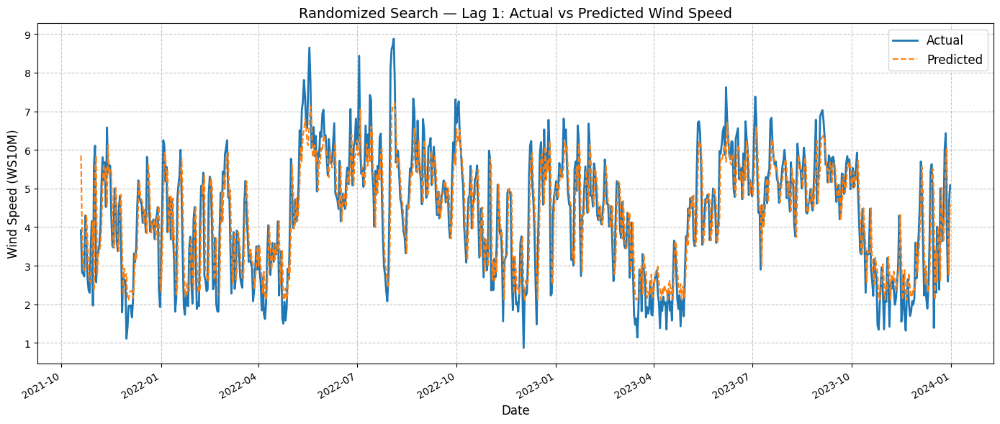


  Randomized Search — Lag 2
  Sample 1/20
  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  Best Parameters (Lag 2): {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}
  Best Validation Loss       : 0.0087
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

*******************************************************
  Randomized Search — Lag 2
*******************************************************
  MSE       : 0.759990
  RMSE      : 0.871774
  MAE       : 0.665544
  MAPE      : 18.890984 %
  R-squared : 0.684840
*******************************************************


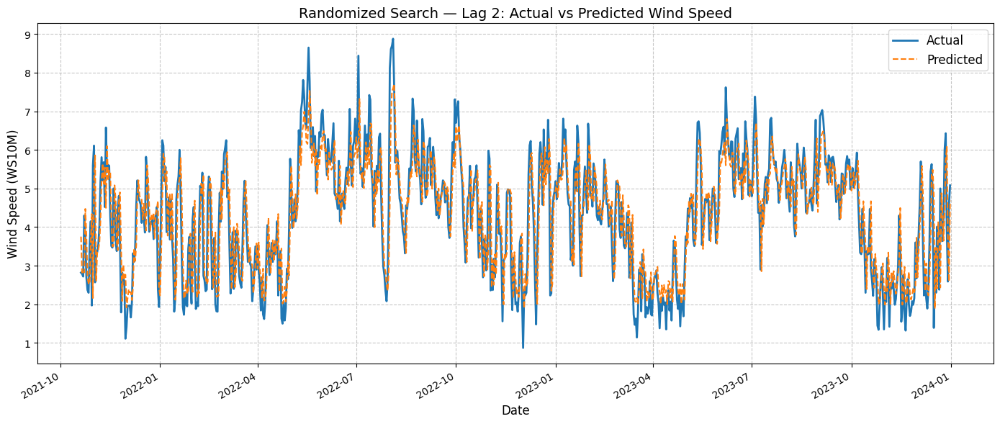


  Randomized Search — Lag 3
  Sample 1/20
  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  Best Parameters (Lag 3): {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}
  Best Validation Loss       : 0.0087
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

*******************************************************
 

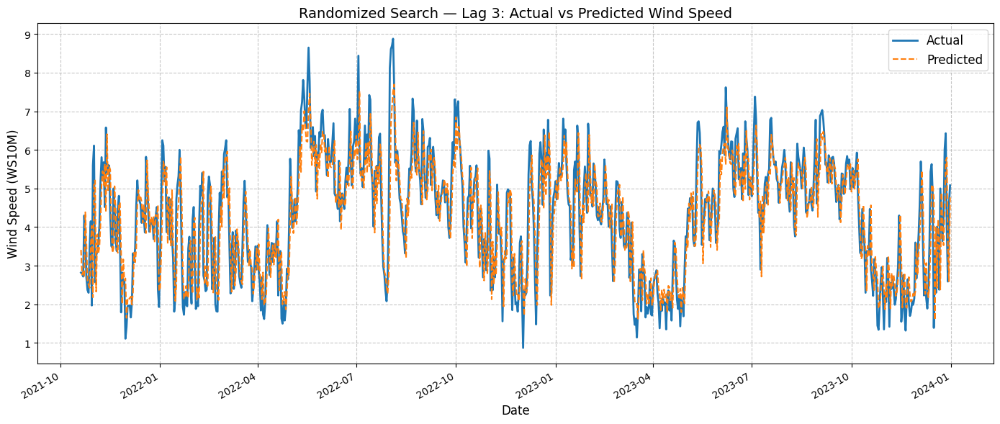


  Randomized Search — Lag 4
  Sample 1/20
  New best found — Val Loss: 0.0093
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0088
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  Best Parameters (Lag 4): {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}
  Best Validation Loss       : 0.0088
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step

*******************************************************
 

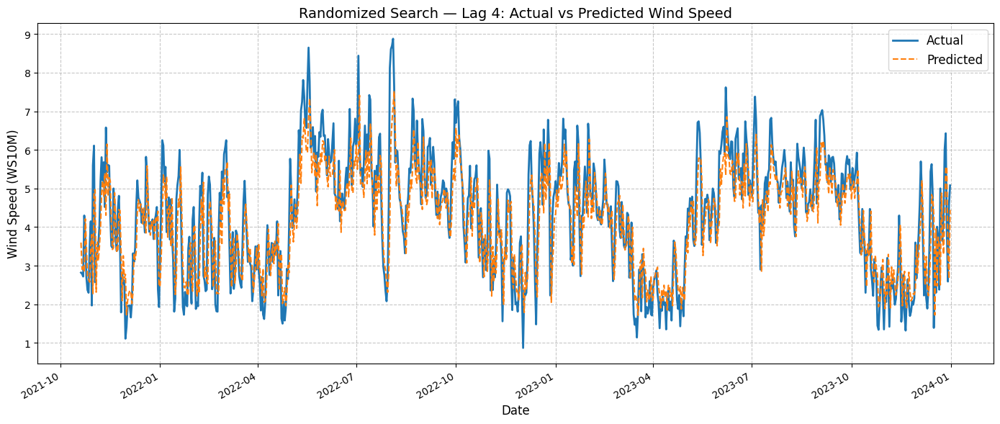


  Randomized Search — Lag 5
  Sample 1/20
  New best found — Val Loss: 0.0090
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(32), 'activation': np.str_('tanh'), 'num_layers': np.int64(2), 'n_units_0': np.int64(128), 'n_units_1': np.int64(64), 'dropout_rate_0': np.float64(0.2), 'dropout_rate_1': np.float64(0.2), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(100)}

  New best found — Val Loss: 0.0086
  Params: {'inpu

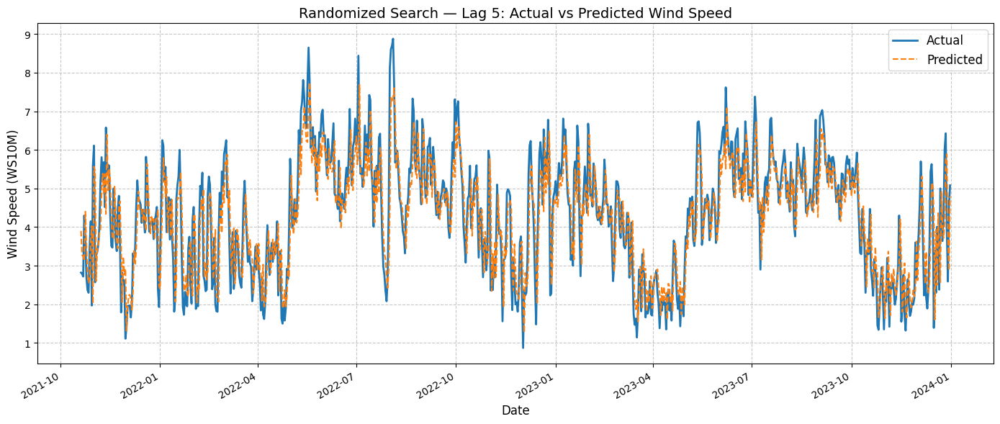


  Randomized Search — Lag 6
  Sample 1/20
  New best found — Val Loss: 0.0093
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0092
  Params: {'input_units': np.int64(64), 'activation': np.str_('tanh'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(32), 'epochs': np.int64(30)}

  New best found — Val Loss: 0.0089
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(32), 'activation': np.str_('tanh'), 'num_

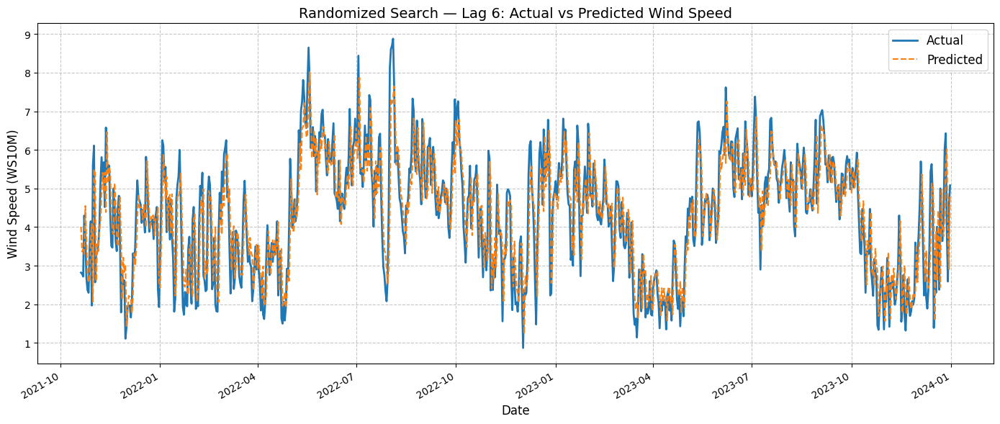


  Randomized Search — Lag 7
  Sample 1/20
  New best found — Val Loss: 0.0097
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0094
  Params: {'input_units': np.int64(64), 'activation': np.str_('tanh'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(32), 'epochs': np.int64(30)}

  New best found — Val Loss: 0.0088
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0085
  Params: {'input_units': np.int64(32), 'activation': np.str_('tanh'), 'num_

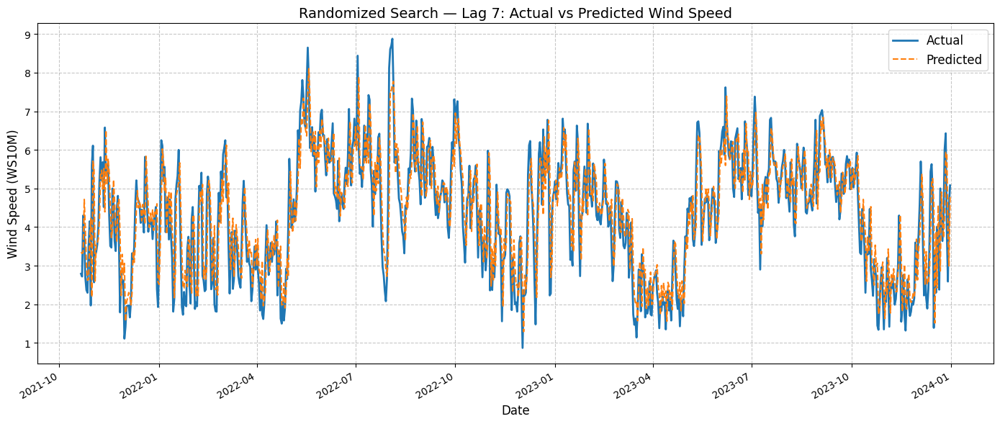


  Randomized Search — Lag 8
  Sample 1/20
  New best found — Val Loss: 0.0096
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0091
  Params: {'input_units': np.int64(64), 'activation': np.str_('tanh'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(32), 'epochs': np.int64(30)}

  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0086
  Params: {'input_units': np.int64(32), 'activation': np.str_('tanh'), 'num_

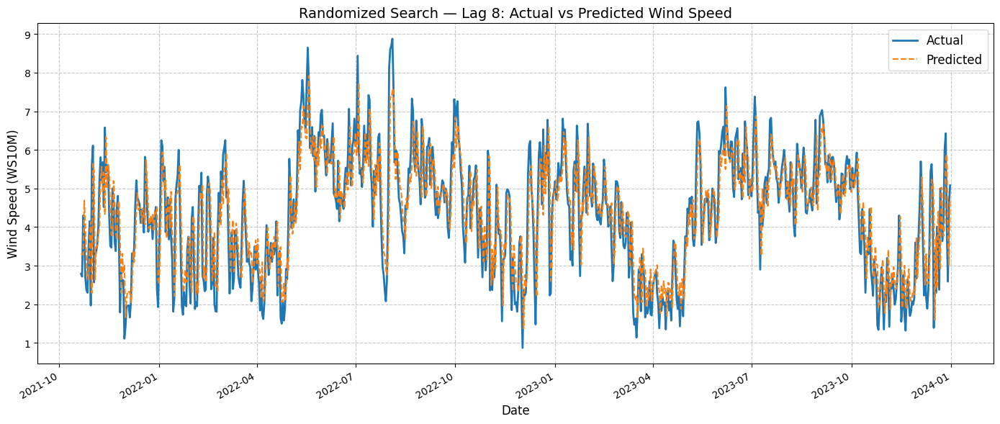


  Randomized Search — Lag 9
  Sample 1/20
  New best found — Val Loss: 0.0090
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0088
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0086
  Params: {'input_units': np.int64(32), 'activation': np.str_('tanh'), 'num_layers': np.int64(2), 'n_units_0': np.int64(128), 'n_units_1': np.int64(64), 'dropout_rate_0': np.float64(0.2), 'dropout_rate_1': np.float64(0.2), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(100)}

  New best found — Val Loss: 0.0086
  Params: {'inpu

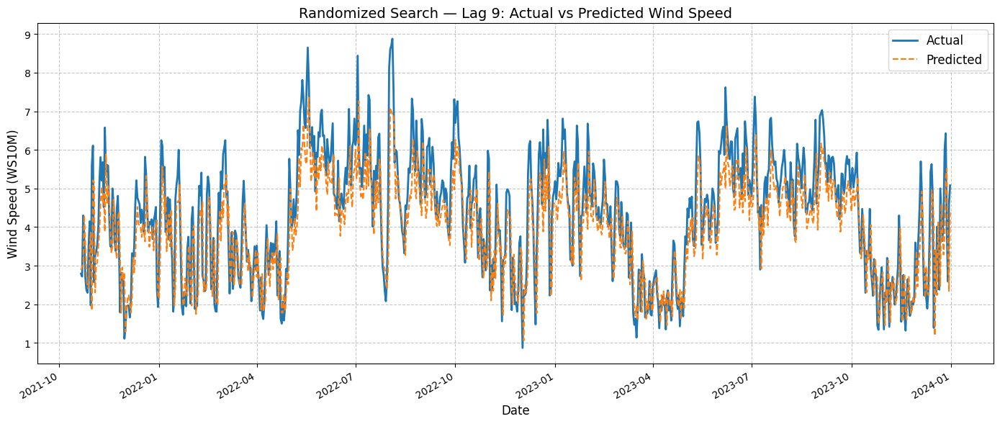


  Randomized Search — Lag 10
  Sample 1/20
  New best found — Val Loss: 0.0097
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0089
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0088
  Params: {'input_units': np.int64(32), 'activation': np.str_('tanh'), 'num_layers': np.int64(2), 'n_units_0': np.int64(128), 'n_units_1': np.int64(64), 'dropout_rate_0': np.float64(0.2), 'dropout_rate_1': np.float64(0.2), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(100)}

  New best found — Val Loss: 0.0087
  Params: {'inp

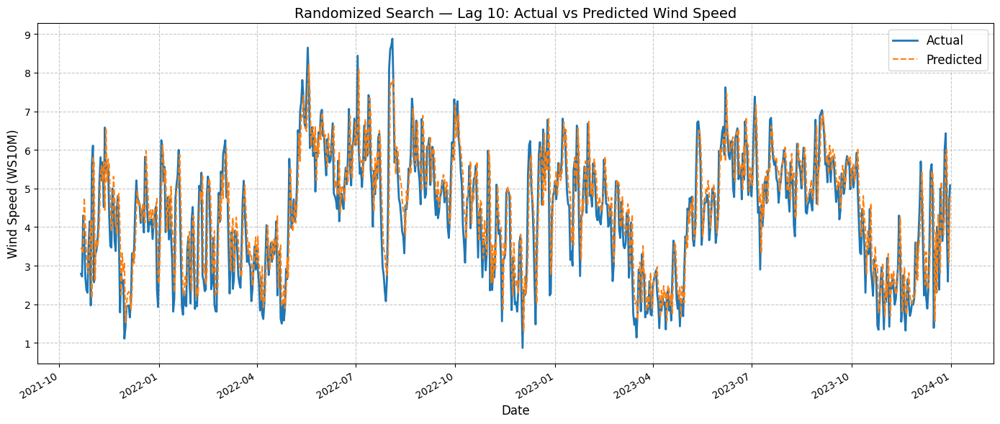


  Randomized Search — Lag 11
  Sample 1/20
  New best found — Val Loss: 0.0097
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0085
  Params: {'input_units': np.int64(32), 'activation': np.str_('tanh'), 'num_layers': np.int64(2), 'n_units_0': np.int64(128), 'n_units_1': np.int64(64), 'dropout_rate_0': np.float64(0.2), 'dropout_rate_1': np.float64(0.2), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(100)}

  Best Parameters (Lag 11): {'input_units': np.int6

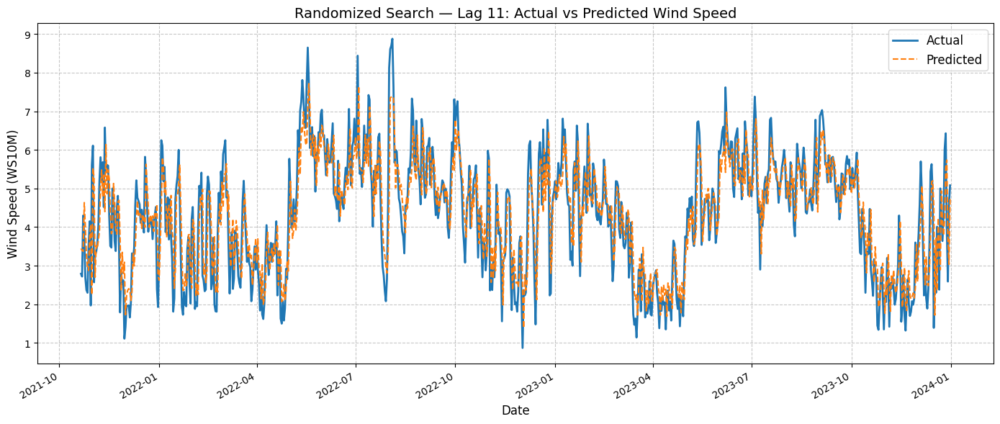


  Randomized Search — Lag 12
  Sample 1/20
  New best found — Val Loss: 0.0095
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0091
  Params: {'input_units': np.int64(64), 'activation': np.str_('tanh'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(32), 'epochs': np.int64(30)}

  New best found — Val Loss: 0.0090
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(32), 'activation': np.str_('tanh'), 'num

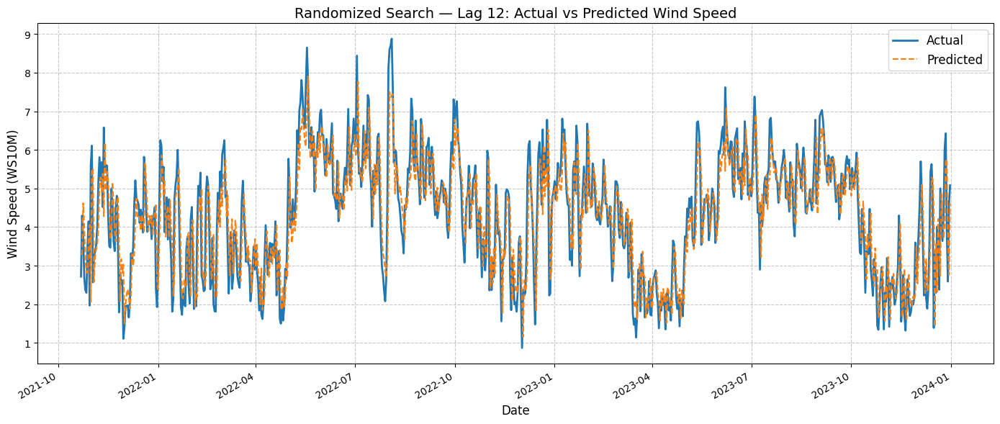


  Randomized Search — Lag 13
  Sample 1/20
  New best found — Val Loss: 0.0089
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0087
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0085
  Params: {'input_units': np.int64(32), 'activation': np.str_('tanh'), 'num_layers': np.int64(2), 'n_units_0': np.int64(128), 'n_units_1': np.int64(64), 'dropout_rate_0': np.float64(0.2), 'dropout_rate_1': np.float64(0.2), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(100)}

  Best Parameters (Lag 13): {'input_units': np.int6

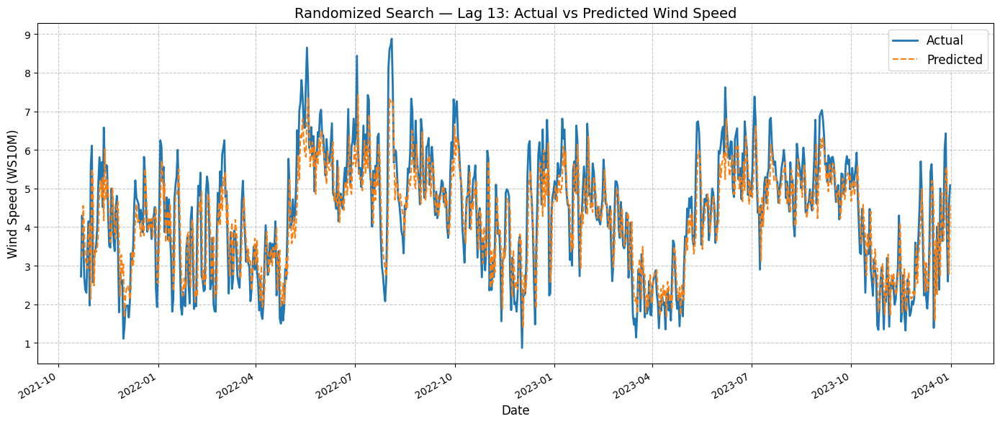


  Randomized Search — Lag 14
  Sample 1/20
  New best found — Val Loss: 0.0102
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(64), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0092
  Params: {'input_units': np.int64(64), 'activation': np.str_('tanh'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('RMSprop'), 'batch_size': np.int64(32), 'epochs': np.int64(30)}

  New best found — Val Loss: 0.0091
  Params: {'input_units': np.int64(96), 'activation': np.str_('relu'), 'num_layers': np.int64(1), 'n_units_0': np.int64(128), 'dropout_rate_0': np.float64(0.5), 'optimizer': np.str_('Adam'), 'batch_size': np.int64(64), 'epochs': np.int64(50)}

  New best found — Val Loss: 0.0085
  Params: {'input_units': np.int64(32), 'activation': np.str_('tanh'), 'num

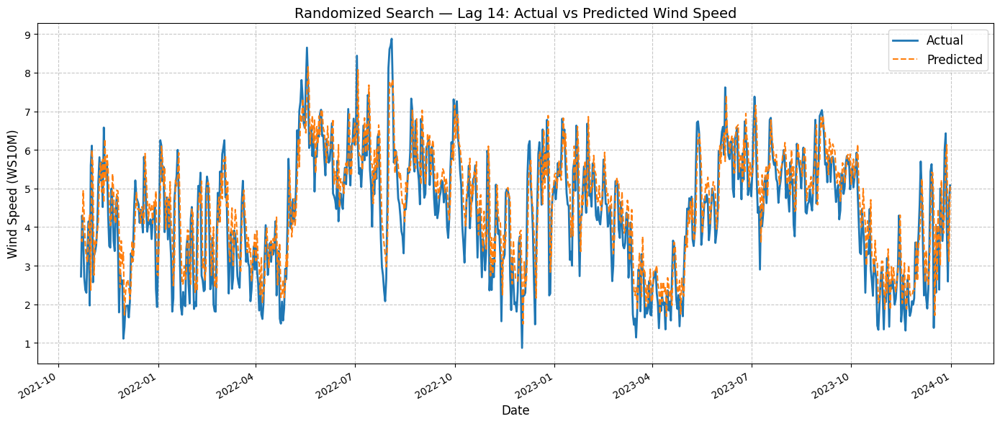


RANDOMIZED SEARCH — SUMMARY ACROSS ALL LAGS
          mse      rmse       mae       mape        r2
lag                                                   
1    0.763010  0.873504  0.669427  19.053479  0.683221
2    0.759990  0.871774  0.665544  18.890984  0.684840
3    0.761121  0.872422  0.669501  18.521833  0.684371
4    0.790725  0.889227  0.686702  18.687265  0.672095
5    0.749498  0.865735  0.663613  18.629493  0.689191
6    0.748733  0.865293  0.662535  18.798391  0.689508
7    0.744112  0.862619  0.664708  19.203577  0.691448
8    0.732691  0.855973  0.660948  19.144100  0.696184
9    0.879030  0.937566  0.729407  18.770725  0.635503
10   0.767119  0.875853  0.677517  19.618980  0.681908
11   0.727839  0.853135  0.658752  18.956616  0.698195
12   0.737082  0.858535  0.659925  18.567169  0.694371
13   0.745443  0.863390  0.666284  18.589541  0.690903
14   0.801759  0.895410  0.701150  20.855777  0.667552

→ Optimal Lag (Randomized Search): 11
  Best Params : {'input_units': np.i

In [ ]:

# ─────────────────────────────────────────────────────────────────────────────
# SECTION 8: RANDOMIZED SEARCH — HYPERPARAMETERS × LAGS 1–14
# ─────────────────────────────────────────────────────────────────────────────
# For each lag length (1–14), a random sample of hyperparameter combinations
# is evaluated using TimeSeriesSplit cross-validation on the training set.

print("\n" + "=" * 70)
print("SECTION 8: RANDOMIZED SEARCH HYPERPARAMETER TUNING")
print("=" * 70)

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Number of random combinations to sample per lag
N_ITER_RANDOM = 20

# Hyperparameter distributions for random sampling
RANDOM_PARAM_OPTIONS = {
    'input_units':    [16, 32, 64, 96, 128],
    'activation':     ['relu', 'tanh'],
    'num_layers':     [1, 2],
    'n_units_0':      [16, 32, 64, 128],
    'n_units_1':      [16, 32, 64],
    'dropout_rate_0': [0.0, 0.1, 0.2, 0.3, 0.5],
    'dropout_rate_1': [0.0, 0.1, 0.2],
    'optimizer':      ['Adam', 'RMSprop', 'SGD'],
    'batch_size':     [16, 32, 64],
    'epochs':         [20, 30, 50, 80, 100]
}


def sample_random_params(options, n_iter, seed):
    """
    Randomly sample n_iter hyperparameter combinations from the given options.
    Parameters irrelevant for num_layers == 1 are removed automatically.

    Parameters:
        options : dict, lists of possible values per hyperparameter
        n_iter  : int, number of combinations to sample
        seed    : int, random seed for reproducibility

    Returns:
        list of dicts, sampled hyperparameter combinations
    """
    rng    = np.random.RandomState(seed)
    params_list = []
    for _ in range(n_iter):
        params = {k: rng.choice(v) for k, v in options.items()}
        if params['num_layers'] == 1:
            params.pop('n_units_1',      None)
            params.pop('dropout_rate_1', None)
        params_list.append(params)
    return params_list


random_results = []

for lag in range(1, 15):
    print(f"\n{'=' * 50}")
    print(f"  Randomized Search — Lag {lag}")
    print(f"{'=' * 50}")

    (X_train_s, X_test_s,
     y_train_s, y_test_s,
     y_test_inv, test_dates,
     scaler_y, _) = prepare_lag_data(lag)

    sampled_params        = sample_random_params(RANDOM_PARAM_OPTIONS,
                                                  N_ITER_RANDOM, SEED)
    best_val_loss_random  = float('inf')
    best_params_random    = None

    # Random search using TimeSeriesSplit CV on training data
    for i, params in enumerate(sampled_params):
        print(f"  Sample {i + 1}/{N_ITER_RANDOM}", end="\r")

        mean_val = cross_validate_model(params, X_train_s, y_train_s, n_splits=5)

        if mean_val < best_val_loss_random:
            best_val_loss_random = mean_val
            best_params_random   = params
            print(f"\n  New best found — Val Loss: {best_val_loss_random:.4f}")
            print(f"  Params: {best_params_random}")

    print(f"\n  Best Parameters (Lag {lag}): {best_params_random}")
    print(f"  Best Validation Loss       : {best_val_loss_random:.4f}")

    # Retrain final model on the FULL training set with best parameters
    model_random = build_ann(best_params_random, n_features=X_train_s.shape[1])
    model_random.fit(
        X_train_s, y_train_s,
        epochs     = best_params_random['epochs'],
        batch_size = best_params_random['batch_size'],
        verbose    = 0
    )

    # Predict and inverse scale
    y_pred_scaled = model_random.predict(X_test_s).flatten()
    y_pred_inv    = scaler_y.inverse_transform(
        y_pred_scaled.reshape(-1, 1)
    ).flatten()

    # Compute and print metrics
    m = compute_metrics(y_test_inv, y_pred_inv)
    print_metrics(m, f"Randomized Search — Lag {lag}")

    # Plot actual vs predicted
    plot_predictions(
        test_dates, y_test_inv, y_pred_inv,
        title=f"Randomized Search — Lag {lag}: Actual vs Predicted Wind Speed"
    )

    random_results.append({'lag': lag, 'best_params': best_params_random, **m})

# Identify optimal lag for Randomized Search
random_summary  = pd.DataFrame(random_results).set_index('lag')
best_random_lag = random_summary['rmse'].idxmin()
best_random_row = random_results[best_random_lag - 1]

print("\n" + "=" * 70)
print("RANDOMIZED SEARCH — SUMMARY ACROSS ALL LAGS")
print("=" * 70)
print(random_summary[['mse', 'rmse', 'mae', 'mape', 'r2']].round(6))
print(f"\n→ Optimal Lag (Randomized Search): {best_random_lag}")
print(f"  Best Params : {best_random_row['best_params']}")
print_metrics(
    {k: best_random_row[k] for k in ['mse', 'rmse', 'mae', 'mape', 'r2']},
    f"Randomized Search — Best Lag {best_random_lag}"
)

# ── Optimal model box for Randomized Search ─────────────────────────────────
print_optimal_model_box(
    method_name = "Randomized Search",
    optimal_lag = best_random_lag,
    best_params = best_random_row['best_params'],
    metrics     = {k: best_random_row[k] for k in ['mse', 'rmse', 'mae', 'mape', 'r2']}
)


SECTION 9: OPTUNA BAYESIAN OPTIMISATION

→ Optimal Lag (Optuna)       : 9
  Best Params                 : {'input_units': 96, 'activation': 'tanh', 'num_layers': 1, 'optimizer': 'SGD', 'batch_size': 16, 'epochs': 100, 'n_units_0': 128, 'dropout_rate_0': 0.05053365977010589}
  Best Validation MSE         : 0.008464
Epoch 1/100
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0404
Epoch 2/100
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0137
Epoch 3/100
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0126
Epoch 4/100
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0116
Epoch 5/100
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0112
Epoch 6/100
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0108
Epoch 7/100
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0107
Epoch 8/100
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0102
Epoch 9/100
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0100
Epoch 10/100
201/201 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0103
Ep

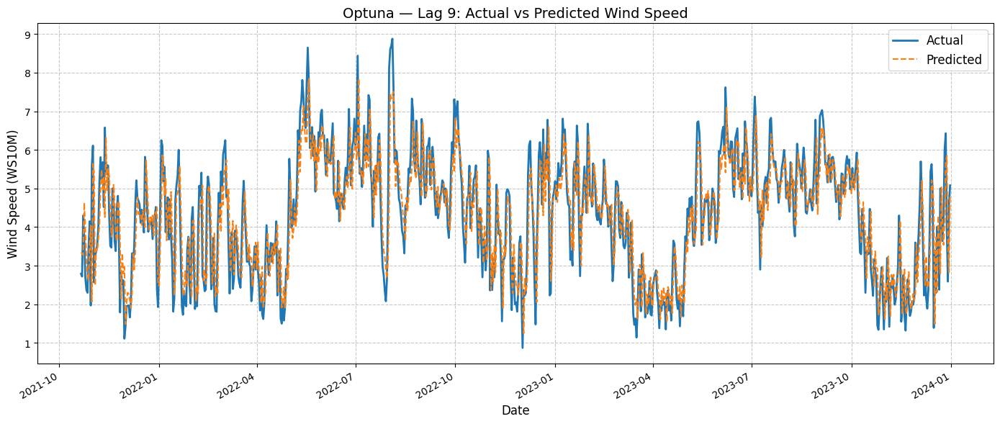


█████████████████████████████████████████████████████████████████
  ✦  OPTIMAL MODEL SUMMARY — OPTUNA
█████████████████████████████████████████████████████████████████
  Optimal Lag Length : 9
  ─────────────────────────────────────────────────────────────
  Hyperparameters:
    input_units            : 96
    activation             : tanh
    num_layers             : 1
    optimizer              : SGD
    batch_size             : 16
    epochs                 : 100
    n_units_0              : 128
    dropout_rate_0         : 0.05053365977010589
  ─────────────────────────────────────────────────────────────
  Test Set Performance:
    MSE                    : 0.730957
    RMSE                   : 0.854960
    MAE                    : 0.657013
    MAPE                   : 18.580958 %
    R-squared              : 0.696903
█████████████████████████████████████████████████████████████████



In [4]:



# ─────────────────────────────────────────────────────────────────────────────
# SECTION 9: OPTUNA BAYESIAN HYPERPARAMETER OPTIMISATION
# ─────────────────────────────────────────────────────────────────────────────
# Optuna jointly optimises both the lag length (1–14) and the model
# hyperparameters. The objective function uses TimeSeriesSplit CV on the
# training set corresponding to each trial's lag. The test set is NEVER
# accessed inside the objective — only used for final evaluation.

print("\n" + "=" * 70)
print("SECTION 9: OPTUNA BAYESIAN OPTIMISATION")
print("=" * 70)

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)


def objective_optuna(trial):
    """
    Optuna objective: jointly optimises lag length and ANN hyperparameters.
    Evaluation is performed exclusively on the training set using
    TimeSeriesSplit CV. The test set is never accessed here.
    """
    # Suggest lag length as a hyperparameter
    lag = trial.suggest_int('lag', 1, 14)

    # Suggest model hyperparameters
    input_units    = trial.suggest_categorical('input_units',    [16, 32, 64, 96, 128])
    activation     = trial.suggest_categorical('activation',     ['relu', 'tanh'])
    num_layers     = trial.suggest_int('num_layers',             1, 3)
    optimizer_name = trial.suggest_categorical('optimizer',      ['Adam', 'RMSprop', 'SGD'])
    batch_size     = trial.suggest_categorical('batch_size',     [16, 32, 64])
    epochs         = trial.suggest_int('epochs',                 10, 100, step=10)

    # Build hyperparameter dict
    params = {
        'input_units': input_units,
        'activation':  activation,
        'num_layers':  num_layers,
        'optimizer':   optimizer_name,
        'batch_size':  batch_size,
        'epochs':      epochs,
    }

    for i in range(num_layers):
        params[f'n_units_{i}']      = trial.suggest_categorical(
            f'n_units_{i}', [16, 32, 64, 128]
        )
        params[f'dropout_rate_{i}'] = trial.suggest_float(
            f'dropout_rate_{i}', 0.0, 0.5
        )

    # Prepare data for the suggested lag (uses training portion only)
    (X_train_s, _, y_train_s, _, _, _, _, _) = prepare_lag_data(lag)

    # Cross-validate on training data — test set is never touched
    return cross_validate_model(params, X_train_s, y_train_s, n_splits=3)


# Run Optuna study — minimise validation MSE, training data only
study = optuna.create_study(
    direction = 'minimize',
    sampler   = TPESampler(seed=SEED)
)
study.optimize(objective_optuna, n_trials=50)

best_params_optuna = study.best_trial.params
best_lag_optuna    = best_params_optuna.pop('lag')   # Extract lag from params

print(f"\n→ Optimal Lag (Optuna)       : {best_lag_optuna}")
print(f"  Best Params                 : {best_params_optuna}")
print(f"  Best Validation MSE         : {study.best_trial.value:.6f}")

# Prepare data for the optimal lag
(X_train_s, X_test_s,
 y_train_s, y_test_s,
 y_test_inv, test_dates,
 scaler_y, _) = prepare_lag_data(best_lag_optuna)

# Retrain the final model on the FULL training set with Optuna best parameters
model_optuna = build_ann(best_params_optuna, n_features=X_train_s.shape[1])
model_optuna.fit(
    X_train_s, y_train_s,
    epochs     = best_params_optuna['epochs'],
    batch_size = best_params_optuna['batch_size'],
    verbose    = 1
)

# Predict and inverse scale
y_pred_scaled_optuna = model_optuna.predict(X_test_s).flatten()
y_pred_inv_optuna    = scaler_y.inverse_transform(
    y_pred_scaled_optuna.reshape(-1, 1)
).flatten()

# Compute and print metrics
optuna_metrics = compute_metrics(y_test_inv, y_pred_inv_optuna)
print_metrics(optuna_metrics, f"Optuna — Best Lag {best_lag_optuna}")

# Plot actual vs predicted
plot_predictions(
    test_dates, y_test_inv, y_pred_inv_optuna,
    title=f"Optuna — Lag {best_lag_optuna}: Actual vs Predicted Wind Speed"
)
# ── Optimal model box for Optuna ────────────────────────────────────────────
print_optimal_model_box(
    method_name = "Optuna",
    optimal_lag = best_lag_optuna,
    best_params = best_params_optuna,
    metrics     = optuna_metrics
)




In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# SECTION 10: FINAL COMPARATIVE RESULTS TABLE
# ─────────────────────────────────────────────────────────────────────────────
# Each method is represented by its optimal lag and corresponding test metrics.

print("\n" + "=" * 70)
print("SECTION 10: FINAL COMPARATIVE RESULTS")
print("=" * 70)

# Retrieve best-lag metrics for each method
orig_best   = orig_summary.loc[best_orig_lag].to_dict()
grid_best   = {k: best_grid_row[k]   for k in ['mse', 'rmse', 'mae', 'mape', 'r2']}
random_best = {k: best_random_row[k] for k in ['mse', 'rmse', 'mae', 'mape', 'r2']}
optuna_best = optuna_metrics

comparison_df = pd.DataFrame({
    "Method":       ["Original Model",  "Grid Search",    "Randomized Search", "Optuna"],
    "Optimal Lag":  [best_orig_lag,      best_grid_lag,    best_random_lag,     best_lag_optuna],
    "Test MSE":     [orig_best['mse'],   grid_best['mse'],  random_best['mse'],  optuna_best['mse']],
    "Test RMSE":    [orig_best['rmse'],  grid_best['rmse'], random_best['rmse'], optuna_best['rmse']],
    "Test MAE":     [orig_best['mae'],   grid_best['mae'],  random_best['mae'],  optuna_best['mae']],
    "Test MAPE (%)": [orig_best['mape'], grid_best['mape'], random_best['mape'], optuna_best['mape']],
    "Test R²":      [orig_best['r2'],    grid_best['r2'],   random_best['r2'],   optuna_best['r2']],
})

print("\nOptimal Lag and Test Set Performance by Method:")
print(comparison_df.to_string(index=False))

# ── Identify the overall best method by Test RMSE ──────────────────────────
best_method_idx  = comparison_df['Test RMSE'].idxmin()
best_method_row  = comparison_df.iloc[best_method_idx]

print(f"\n{'=' * 70}")
print(f"  OVERALL BEST METHOD  : {best_method_row['Method']}")
print(f"  Optimal Lag          : {best_method_row['Optimal Lag']}")
print(f"  Test MSE             : {best_method_row['Test MSE']:.6f}")
print(f"  Test RMSE            : {best_method_row['Test RMSE']:.6f}")
print(f"  Test MAE             : {best_method_row['Test MAE']:.6f}")
print(f"  Test MAPE            : {best_method_row['Test MAPE (%)']:.6f} %")
print(f"  Test R²              : {best_method_row['Test R²']:.6f}")
print(f"{'=' * 70}")

# Save the comparison table to CSV
comparison_df.to_csv("ANN_LagOptimisation_Results.csv", index=False)
print("\nResults saved to ANN_LagOptimisation_Results.csv")